In [1]:
# those variables will be updated by Mercury framework
# let's keep all variables to be updated in one cell
is_heatmap_show = True
is_charts_show = True
selected_category = 'Population'
stadsdeel = 'Centrum'

# <center> Amsterdam on charts and maps (on 1 January 2021) </center>

In [2]:
#pip install plotly

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import folium
from folium import plugins
import geopandas as gpd
import shapely
import plotly
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from IPython.display import Markdown as Markdown, display
from branca.colormap import linear

geo_data = pd.read_csv("geodata_amsterdam.csv")
geo_data['geometry'] = geo_data['geometry'].apply(lambda x: shapely.wkt.loads(x))  

In [4]:
data = pd.read_csv('amsterdam_buurten.csv')

In [5]:
category_map = {'Population density per km2':'bevolkingsdichtheid_inwoners_per_km2', 
                'Population': 'aantal_inwoners', 
                'Men': 'mannen', 
                'Women': 'vrouwen', 
                'People aged 0 to 15 (in %)': 'percentage_personen_0_tot_15_jaar', 
                'People aged 15 to 25 (in %)': 'percentage_personen_15_tot_25_jaar', 
                'People aged 25 to 45 (in %)': 'percentage_personen_25_tot_45_jaar', 
                'People aged 45 to 65 (in %)': 'percentage_personen_45_tot_65_jaar', 
                'People aged 65 and older (in %)': 'percentage_personen_65_jaar_en_ouder', 
                'Unmarried (in %)': 'percentage_ongehuwd', 
                'Married (in %)': 'percentage_gehuwd', 
                'Divorced (in %)': 'percentage_gescheid', 
                'Widowed (in %)': 'percentage_verweduwd', 
                'Births per 1000 inhabitants': 'geboortes_per_1000_inwoners', 
                'Number of households': 'aantal_huishoudens', 
                'Average household size': 'gemiddelde_huishoudsgrootte', 
                'Housing stock': 'woningvoorraad', 
                'Average house value': 'gemiddelde_woningwaarde',
                'Houses built before 2000 year  (in %)': 'percentage_bouwjaarklasse_tot_2000',
                'Amount of passenger cars (total)': 'personenautos_totaal', 
                'Two-wheelers motor transport (total)': 'motortweewielers_totaal'
               }
category = category_map[selected_category]

colormap = linear.YlOrRd_09.scale(min(data[category]),
                                  max(data[category]))
colormap.caption = category
    
def style_fn(feature):
    #colormap = branca.colormap.LinearColormap(["white", "green"], vmin=0, vmax=100)
    most_common = feature["properties"][category]
    ss = {
        "fillColor": colormap(most_common),
        "fillOpacity": 0.8,
        "weight": 0.9,
        "opacity": 1,
        "color": "black",
    }
    return ss

def get_selected_category(row):
    data_row = data[data['buurtcode'] == row['buurtcode']]
    value = 0 if data_row.empty else data_row[category].iloc[0]
    return value

def get_buurt_naam(row):
    data_row = data[data['buurtcode'] == row['buurtcode']]
    return "" if data_row.empty else data_row['buurtnaam'].iloc[0]
    

def show_heatmap():
    #Amsterdam
    
    latitude = 52.377956
    longitude = 4.8970
    
    # create map and display it
    m = folium.Map(location=[latitude, longitude], 
                   zoom_start=12)
    
    colormap.add_to(m)

    geo_data[category] = geo_data.apply(lambda row: get_selected_category(row), axis=1)
    geo_data['buurt'] = geo_data.apply(lambda row: get_buurt_naam(row), axis=1)
    
    gdf = gpd.GeoDataFrame(data=geo_data, geometry=geo_data['geometry'], crs=4329)
    
    folium.GeoJson(
        gdf.__geo_interface__,
        style_function=style_fn,
        tooltip=folium.features.GeoJsonTooltip(['buurt', category]),
    ).add_to(m)
    
    # show map
    display(m)


if is_heatmap_show:
    show_heatmap()

In [6]:

colors = ["#e60049", "#0bb4ff", "#50e991", "#e6d800", "#9b19f5", "#ffa300", "#dc0ab4", "#b3d4ff", "#00bfa0"]

def show_bedrijven_by_industry_charts(buurt_data):
    data_bedrijven = buurt_data[['stadsdeel',
                                 'aantal_bedrijven_landbouw_bosbouw_visserij',
                                 'aantal_bedrijven_nijverheid_energie',
                                 'aantal_bedrijven_handel_en_horeca',
                                 'aantal_bedrijven_vervoer_informatie_communicatie',
                                 'aantal_bedrijven_financieel_onroerend_goed',
                                 'aantal_bedrijven_zakelijke_dienstverlening',
                                 'aantal_bedrijven_overheid_onderwijs_en_zorg',
                                 'aantal_bedrijven_cultuur_recreatie_overige',
                                 'aantal_bedrijfsvestigingen']].copy()
    
    labels_bedrijven = ['Agriculture, forestry and fishing',
                        'Industry and Energy',
                        'Trade and Hospitality',
                        'Transport, information and communication',
                        'Financial Services, Real Estate',
                        'Business services',
                        'Government, education and healthcare',
                        'Culture, recreation, other services']
    
    values_bedrijven = [data_bedrijven['aantal_bedrijven_landbouw_bosbouw_visserij'].mean(),
                        data_bedrijven['aantal_bedrijven_nijverheid_energie'].mean(),
                        data_bedrijven['aantal_bedrijven_handel_en_horeca'].mean(),
                        data_bedrijven['aantal_bedrijven_vervoer_informatie_communicatie'].mean(),
                        data_bedrijven['aantal_bedrijven_financieel_onroerend_goed'].mean(),
                        data_bedrijven['aantal_bedrijven_zakelijke_dienstverlening'].mean(),
                        data_bedrijven['aantal_bedrijven_overheid_onderwijs_en_zorg'].mean(),
                        data_bedrijven['aantal_bedrijven_cultuur_recreatie_overige'].mean()]

    fig = go.Figure(data=[go.Pie(labels=labels_bedrijven, values=values_bedrijven,marker_colors=colors)])
    fig.update_traces(textinfo='percent+label')
    fig.update_layout(showlegend = False, 
                      title=dict(text="by industry",
                                 font=dict(family="Arial", size=20, color='#283747')))  
    fig.show()


In [7]:
def show_all_bedrijven_charts(buurt_data):
    data_bedrijven = buurt_data[['stadsdeel',
                                 'aantal_bedrijven_landbouw_bosbouw_visserij',
                                 'aantal_bedrijven_nijverheid_energie',
                                 'aantal_bedrijven_handel_en_horeca',
                                 'aantal_bedrijven_vervoer_informatie_communicatie',
                                 'aantal_bedrijven_financieel_onroerend_goed',
                                 'aantal_bedrijven_zakelijke_dienstverlening',
                                 'aantal_bedrijven_overheid_onderwijs_en_zorg',
                                 'aantal_bedrijven_cultuur_recreatie_overige',
                                 'aantal_bedrijfsvestigingen']].copy()
    
    values_bedrijven_all = data.groupby('stadsdeel')[['aantal_bedrijfsvestigingen', 
                                                      'aantal_bedrijven_nijverheid_energie'
                                                     ]].apply(sum)
    
    values_bedrijven_all = values_bedrijven_all.reset_index()
    
    index_stadsdeel = values_bedrijven_all.loc[values_bedrijven_all['stadsdeel'] == stadsdeel].index[0]
    
    specs = [[{'type':'pie'}, {"type": "bar"}]]
    
    fig = make_subplots(rows=1, cols=2, specs=specs, shared_yaxes = True,subplot_titles=['',
                                                                                     ''])
    
    colors_histogram = ['lightslategray',] * 9
    colors_histogram[index_stadsdeel] = 'crimson'
    
    
    label_stadsdeel = "Companies in " + stadsdeel
    label_others = "Companies outside " + stadsdeel
    
    value_amster = data['aantal_bedrijfsvestigingen'].sum()
    value_stadsdeel = buurt_data['aantal_bedrijfsvestigingen'].sum()
    value_others = value_amster - value_stadsdeel
    
    fig.add_trace(go.Pie(labels=[label_others, label_stadsdeel], values=[value_others, value_stadsdeel], 
                         marker_colors=colors), 1, 1)  
    
    fig.update_traces(textinfo='label + percent')
    
    fig.add_trace(go.Histogram(
        histfunc = 'sum',
        x = values_bedrijven_all['stadsdeel'],
        y = values_bedrijven_all['aantal_bedrijfsvestigingen'],
        marker_color = colors_histogram),1,2)
    
    fig.update_layout(showlegend=False, 
                      title=dict(text="Total", 
                                 font=dict(family="Arial", size=20, color='#283747')))  
    fig.show()


In [8]:
def style_fn(feature):
    ss = {
        "fillColor": "red",
        "fillOpacity": 0.9,
        "weight": 0.9,
        "opacity": 1,
        "color": "black",
    }
    return ss

def show_district_map(buurt_data):
    #Amsterdam
    latitude = 52.377956
    longitude = 4.8970
    
    # create map and display it
    m = folium.Map(location=[latitude, longitude], 
                   zoom_start=12)#, tiles='CartoDB positron')
    
    buurtcoden = buurt_data.buurtcode.unique()
    new_geodata = geo_data[geo_data['buurtcode'].isin(buurtcoden)]
    
    new_geodata = new_geodata.copy()
    
    gdf = gpd.GeoDataFrame(data=new_geodata, geometry=new_geodata['geometry'], crs=4329)
    
    folium.GeoJson(
        gdf.__geo_interface__,
        style_function=style_fn
    ).add_to(m)
    
    display(Markdown("# {}  on the map".format(stadsdeel)))

    # show map
    display(m)

In [9]:

def show_housing_charts(buurt_data):
    values_woz_all = data.groupby('stadsdeel')['gemiddelde_woningwaarde'].mean().reset_index()
    #print(values_woz_all)
    index_stadsdeel = values_woz_all.loc[values_woz_all['stadsdeel'] == stadsdeel].index[0]
    
    specs = [[{'type':'pie'}, {"type": "bar"}]]
    
    fig = make_subplots(rows=1, cols=2, specs=specs, shared_yaxes = True,
                        subplot_titles=['',
                                        'Average house value (x 1,000 euros)'])
    
    colors_histogram = ['lightslategray',] * 9
    colors_histogram[index_stadsdeel] = 'crimson'
    
    label_stadsdeel = "in " + stadsdeel
    label_others = "outside " + stadsdeel
    
    value_amster = data['woningvoorraad'].sum()
    value_stadsdeel = buurt_data['woningvoorraad'].sum()
    value_others = value_amster - value_stadsdeel
    
    fig.add_trace(go.Pie(labels=[label_others, label_stadsdeel], values=[value_others, value_stadsdeel], 
                         marker_colors=colors), 1, 1)  
    
    fig.update_traces(textinfo='label + percent')
    
    fig.add_trace(go.Histogram(
        histfunc = 'sum',
        x = values_woz_all['stadsdeel'],
        y = values_woz_all['gemiddelde_woningwaarde'],
        marker_color = colors_histogram),1,2)
    
    fig.update_layout(showlegend=False)  
    fig.update_layout(showlegend=False, 
                      title=dict(text="Number of houses", 
                                 font=dict(family="Arial", size=20, color='#283747')))  
    
    fig.show()
    
    
    values_buurt = data.groupby('stadsdeel')[['eengezinswoning',
                               'meergezinswoning',
                               'koopwoningen',
                               'huurwoningen',
                               'huurwoningen_in_bezit_woningcorporaties',
                               'huurwoningen_in_bezit_overige_verhuurders',
                               'woningen_met_eigendom_onbekend',
                               'bouwjaarklasse_tot_2000',
                               'bouwjaarklasse_vanaf_2000']].sum().reset_index()
    
    value_single = values_buurt[values_buurt['stadsdeel'] == stadsdeel]['eengezinswoning'].iloc[0]
    value_multi = values_buurt[values_buurt['stadsdeel'] == stadsdeel]['meergezinswoning'].iloc[0]
    bouwjaarklasse_tot_2000 = values_buurt[values_buurt['stadsdeel'] == stadsdeel]['bouwjaarklasse_tot_2000'].iloc[0]
    bouwjaarklasse_vanaf_2000 = values_buurt[values_buurt['stadsdeel'] == stadsdeel]['bouwjaarklasse_vanaf_2000'].iloc[0]
    
    value_koop = values_buurt[values_buurt['stadsdeel'] == stadsdeel]['koopwoningen'].iloc[0]
    value_huur = values_buurt[values_buurt['stadsdeel'] == stadsdeel]['huurwoningen'].iloc[0]
    value_onbekend = values_buurt[values_buurt['stadsdeel'] == stadsdeel]['woningen_met_eigendom_onbekend'].iloc[0]
    woningcorporaties = values_buurt[values_buurt['stadsdeel'] == stadsdeel]['huurwoningen_in_bezit_woningcorporaties'].iloc[0]
    overige_verhuurders = values_buurt[values_buurt['stadsdeel'] == stadsdeel]['huurwoningen_in_bezit_overige_verhuurders'].iloc[0]
    
    
    specs = [[{'type':'pie'}, {"type": "pie"}], [{'type':'pie'}, {"type": "pie"}]]
    fig = make_subplots(rows=2, cols=2, specs = specs, shared_yaxes = True, subplot_titles=['','Houses built', 'Properties','Owned by'])
    fig.add_trace(go.Pie(labels = ['Single-family','Multi-family'], values = [value_single, value_multi], marker_colors=colors), 1, 1)  
    fig.add_trace(go.Pie(labels = ['before 2000','after 2000'], values = [bouwjaarklasse_tot_2000,bouwjaarklasse_vanaf_2000], marker_colors=colors), 1, 2)  
    fig.add_trace(go.Pie(labels = ['owner-occupied','rental'], values = [value_koop, value_huur], marker_colors=colors), 2, 1)  
    fig.add_trace(go.Pie(labels = ['housing association','other landlords', 'ownership unknown'], values = [woningcorporaties, overige_verhuurders, value_onbekend], marker_colors=colors), 2, 2)  
    fig.update_layout(showlegend = False, title=dict(text="Houses characteristics", font=dict(family="Arial", size=20, color='#283747')))  
    fig.update_traces(textinfo='label')
    fig.show()
    


In [10]:
def show_amenities(buurt_data):
    values_buurt = data.groupby('stadsdeel')[['huisartsenpraktijk_gemiddelde_afstand_in_km',
                                              'apotheek_gemiddelde_afstand_in_km',
                                              'grote_supermarkt_gemiddelde_afstand_in_km',
                                              'winkels_ov_dagelijkse_levensm_gem_afst_in_km',
                                              'cafe_gemiddelde_afstand_in_km',
                                              'cafetaria_gemiddelde_afstand_in_km',
                                              'restaurant_gemiddelde_afstand_in_km',
                                              'hotel_gemiddelde_afstand_in_km',
                                              'brandweerkazerne_gemiddelde_afstand_in_km',
                                              'zwembad_gemiddelde_afstand_in_km',
                                              'kunstijsbaan_gemiddelde_afstand_in_km',
                                              'bibliotheek_gemiddelde_afstand_in_km',
                                              'bioscoop_gemiddelde_afstand_in_km',
                                              'sauna_gemiddelde_afstand_in_km',
                                              'zonnebank_gemiddelde_afstand_in_km',
                                              'attractiepark_gemiddelde_afstand_in_km']].mean().reset_index()
    
    
    value_huisarts = values_buurt[values_buurt['stadsdeel'] == stadsdeel]['huisartsenpraktijk_gemiddelde_afstand_in_km'].iloc[0]
    value_apotheek = values_buurt[values_buurt['stadsdeel'] == stadsdeel]['apotheek_gemiddelde_afstand_in_km'].iloc[0]
    value_grote_supermarkt = values_buurt[values_buurt['stadsdeel'] == stadsdeel]['grote_supermarkt_gemiddelde_afstand_in_km'].iloc[0]
    value_winkels_ov_dagelijkse = values_buurt[values_buurt['stadsdeel'] == stadsdeel]['winkels_ov_dagelijkse_levensm_gem_afst_in_km'].iloc[0]
    value_cafe = values_buurt[values_buurt['stadsdeel'] == stadsdeel]['cafe_gemiddelde_afstand_in_km'].iloc[0]
    value_cafetaria = values_buurt[values_buurt['stadsdeel'] == stadsdeel]['cafetaria_gemiddelde_afstand_in_km'].iloc[0]
    value_restaurant = values_buurt[values_buurt['stadsdeel'] == stadsdeel]['restaurant_gemiddelde_afstand_in_km'].iloc[0]
    
    labels = ['GP practice', 'Pharmacy', 'Large supermarket', 'Daily groceries', 'Cafe', 'Cafeteria', 'Restaurant']
    
    fig = go.Figure()
    fig.add_trace(go.Bar(
        x = labels,
        y = [value_huisarts, value_apotheek, value_grote_supermarkt, value_winkels_ov_dagelijkse, value_cafe, value_cafetaria,
            value_restaurant],
    marker_color=colors))
    
    fig.update_traces(texttemplate='%{y:.1f}')
    fig.update_layout(xaxis_tickangle=-45,
                 title_text='Average distance to daily life amenities (in km)')#uniformtext_minsize=8, uniformtext_mode='hide', 
    fig.update_layout(barmode='stack', xaxis={'categoryorder': 'total ascending'})
    fig.show()
    
    values_education = data.groupby('stadsdeel')[['kinderdagverblijf_gemiddelde_afstand_in_km',
                                                  'buitenschoolse_opvang_gem_afstand_in_km',
                                              'basisonderwijs_gemiddelde_afstand_in_km',
                                              'voortgezet_onderwijs_gem_afstand_in_km',
                                              'vmbo_gemiddelde_afstand_in_km',
                                              'havo_vwo_gemiddelde_afstand_in_km']].mean().reset_index()
    
    value_kinderdagverblijf = values_education[values_education['stadsdeel'] == stadsdeel]['kinderdagverblijf_gemiddelde_afstand_in_km'].iloc[0]
    value_bso = values_education[values_education['stadsdeel'] == stadsdeel]['buitenschoolse_opvang_gem_afstand_in_km'].iloc[0]
    value_basisonderwijs = values_education[values_education['stadsdeel'] == stadsdeel]['basisonderwijs_gemiddelde_afstand_in_km'].iloc[0]
    value_voortgezet = values_education[values_education['stadsdeel'] == stadsdeel]['voortgezet_onderwijs_gem_afstand_in_km'].iloc[0]
    value_vmbo = values_education[values_education['stadsdeel'] == stadsdeel]['vmbo_gemiddelde_afstand_in_km'].iloc[0]
    value_havo_vwo = values_education[values_education['stadsdeel'] == stadsdeel]['havo_vwo_gemiddelde_afstand_in_km'].iloc[0]
    
    labels = ['Daycare', 'After school care', 'Primary schools', 'Secondary school', 'Pre-vocational secondary education', 
              'High education']
    
    fig = go.Figure()
    fig.add_trace(go.Bar(
        x = labels,
        y = [value_kinderdagverblijf, value_bso, value_basisonderwijs, value_voortgezet, value_vmbo, value_havo_vwo],
        marker_color=colors))
    
    fig.update_traces(texttemplate='%{y:.1f}')
    fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide', xaxis_tickangle=-45,
                 title_text='Average distance to education (in km)')
    fig.update_layout(barmode='stack', xaxis={'categoryorder': 'total ascending'})
    fig.show()
    
    
    labels = ['Hotel', 'Fire station', 'Swimming pool', 'Artificial ice skating rink', 'Library', 'Cinema', 
              'Sauna', 'Tanning bed', 'Attraction']
    value_sauna = values_buurt[values_buurt['stadsdeel'] == stadsdeel]['sauna_gemiddelde_afstand_in_km'].iloc[0]
    value_zonnebank = values_buurt[values_buurt['stadsdeel'] == stadsdeel]['zonnebank_gemiddelde_afstand_in_km'].iloc[0]
    value_attractiepark = values_buurt[values_buurt['stadsdeel'] == stadsdeel]['attractiepark_gemiddelde_afstand_in_km'].iloc[0]
    value_hotel = values_buurt[values_buurt['stadsdeel'] == stadsdeel]['hotel_gemiddelde_afstand_in_km'].iloc[0]
    value_brandweerkazerne = values_buurt[values_buurt['stadsdeel'] == stadsdeel]['brandweerkazerne_gemiddelde_afstand_in_km'].iloc[0]
    value_zwembad = values_buurt[values_buurt['stadsdeel'] == stadsdeel]['zwembad_gemiddelde_afstand_in_km'].iloc[0]
    value_kunstijsbaan = values_buurt[values_buurt['stadsdeel'] == stadsdeel]['kunstijsbaan_gemiddelde_afstand_in_km'].iloc[0]
    value_bibliotheek = values_buurt[values_buurt['stadsdeel'] == stadsdeel]['bibliotheek_gemiddelde_afstand_in_km'].iloc[0]
    value_bioscoop = values_buurt[values_buurt['stadsdeel'] == stadsdeel]['bioscoop_gemiddelde_afstand_in_km'].iloc[0]
    
    fig = go.Figure()
    fig.add_trace(go.Bar(
        x = labels,
        y = [value_hotel, value_brandweerkazerne, value_zwembad, value_kunstijsbaan, value_bibliotheek, value_bioscoop, 
            value_sauna, value_zonnebank, value_attractiepark],
    marker_color=colors))
    fig.update_traces(texttemplate='%{y:.1f}')
    fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide', xaxis_tickangle=-45,
                 title_text='Average distance to other amenities (in km)')
    fig.update_layout(barmode='stack', xaxis={'categoryorder': 'total ascending'})
    fig.show()
    

## <center>Companies in Centrum</center>

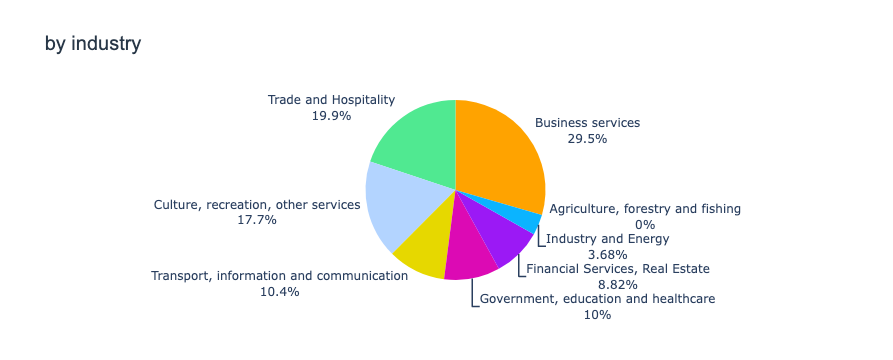

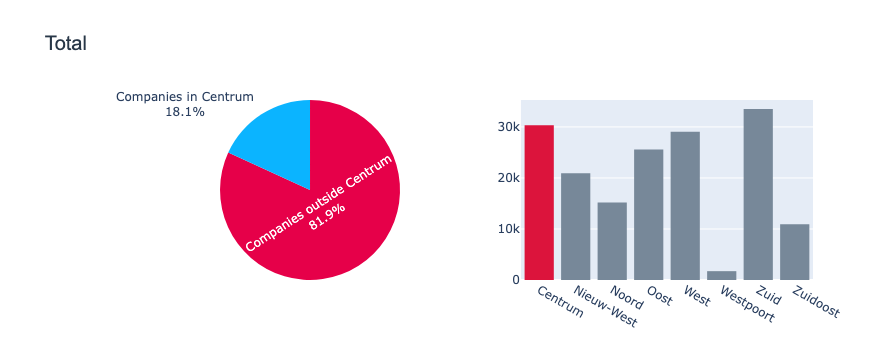

## <center>Housing in Centrum</center>

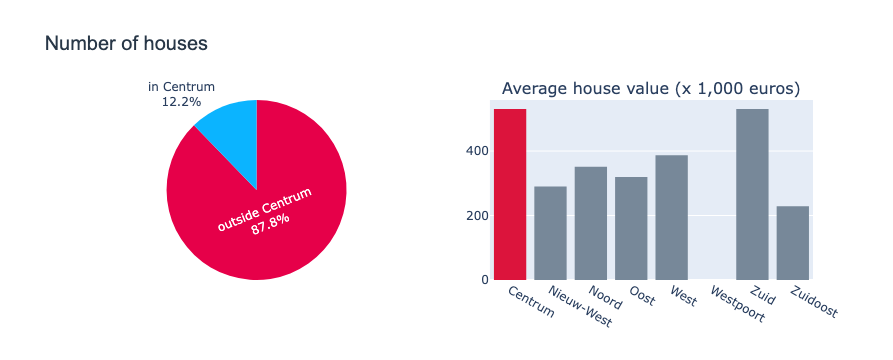

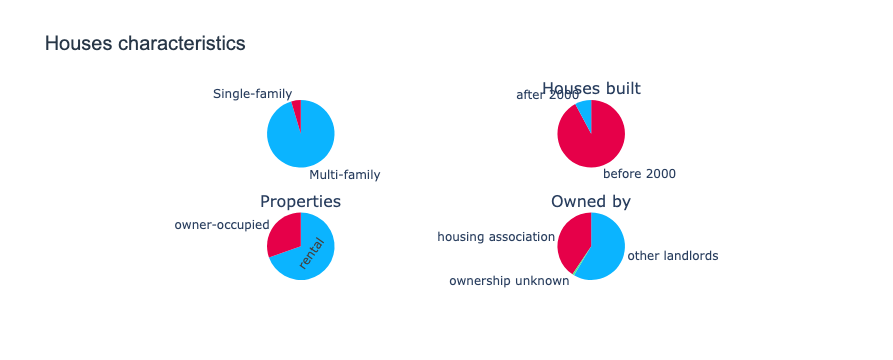

## <center>Amenities in Centrum</center>

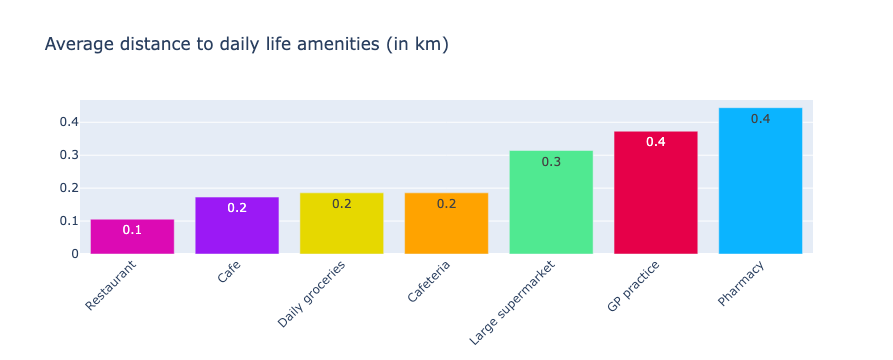

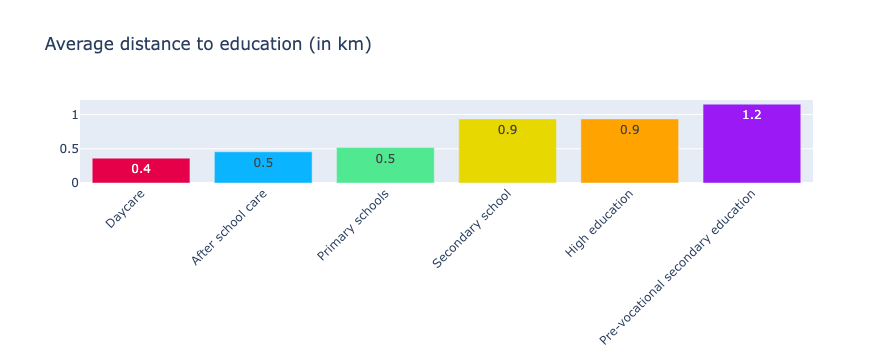

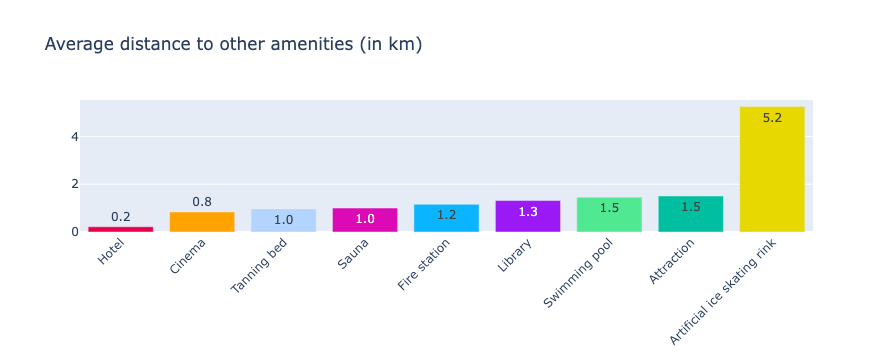

# Centrum  on the map

In [11]:
if is_charts_show:
    buurt_data = data[data['stadsdeel'] == stadsdeel]
    display(Markdown("## <center>Companies in " + stadsdeel + "</center>"))
    show_bedrijven_by_industry_charts(buurt_data)
    show_all_bedrijven_charts(buurt_data)
    display(Markdown("## <center>Housing in " + stadsdeel + "</center>"))
    show_housing_charts(buurt_data)
    display(Markdown("## <center>Amenities in " + stadsdeel + "</center>"))
    show_amenities(buurt_data)
    show_district_map(buurt_data)

In [12]:
#data.columns.to_list()